Just a simple script to show the image and label data for each patient as well as a few relevant clinical notes

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
from skimage.util.montage import montage2d
from skimage.color import label2rgb
import os
import h5py
import seaborn as sns
sns.set_style("whitegrid", {'axes.grid': False})

# Data Overview
The the CT data (as a radiograph), the PET data (as an MIP image) and the label (as an MIP image) for the a series of patients. Verify that the images and labelings match up with text descriptions

In [2]:
%matplotlib inline
ct_image = None
pt_image = None
with h5py.File(os.path.join('..', 'input', 'lab_petct_vox_5.00mm.h5'), 'r') as p_data:
    for (p_id, ct_img), pt_img, lab_img in zip(
                                   p_data['ct_data'].items(),
                                   p_data['pet_data'].values(),
                                   p_data['label_data'].values()
                                                      ):
        pt_image = np.array(pt_img)     
        ct_image = np.array(ct_img)
        cur_ct_img = np.sum(ct_img,1).squeeze()[::-1,:]
        cur_pet_img = np.sum(pt_img,1).squeeze()[::-1,:]
        cur_lab_img = np.max(lab_img,1).squeeze()[::-1,:]
        print(cur_ct_img)
        break # only load the first patient


[[-100000.         -99863.734375   -99770.1484375 ...,  -99333.9140625
   -99661.4609375 -100000.       ]
 [-100000.         -99711.5625     -99580.828125  ...,  -99642.9609375
   -99715.359375  -100000.       ]
 [-100000.         -99903.6796875  -99833.5234375 ...,  -99447.8125
   -99540.078125  -100000.       ]
 ..., 
 [-100000.         -99460.640625   -98801.8046875 ...,  -99592.46875
   -99751.7734375 -100000.       ]
 [-100000.         -99442.359375   -98840.65625   ...,  -99617.578125
   -99796.359375  -100000.       ]
 [-100000.         -99387.2109375  -98960.734375  ...,  -99503.90625
   -99433.078125  -100000.       ]]


# From Slices to Tiles
Here we go from the simple images to many little tiles the i,j indices iterate over the image while the $i_k$ and $j_k$ iterate over overlapping regions

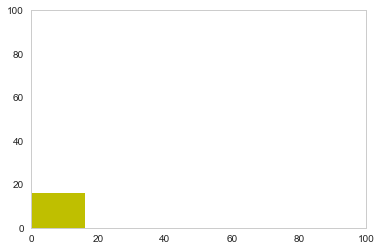

In [3]:
from matplotlib import pyplot as plt
from matplotlib import animation
import matplotlib.patches as patches
coords = []
texts = []
for i in range(0, 100, 16):
    for j in range(0, 100, 16):
        #for z in range(0,  100, 16):
            for i_k in range(0, 16, 16):
                for j_k in range(0, 16, 16):
                    #for z_k in range(0,16,16):
                        coords.append((i+i_k,j+j_k))#,z+z_k))
                        texts.append('('+str(i) + ') ' +'('+ str(i_k) + ') ' +'('+ str(j) + ' )'+'('+ str(j_k)+' )')# +'('+ str(z) + ' )'+ str(z_k))
                
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
ax = plt.axes(xlim=(0, 100), ylim=(0, 100))
box = patches.Rectangle((0,0),16,16, fc='y')
ttl = ax.text(.5, 1.005, '', transform = ax.transAxes)

# initialization function: plot the background of each frame
def init():
    ttl.set_text('')
    ax.add_patch(box)
    return box,

# animation function.  This is called sequentially
def animate(i):
    #ttl.set_text(str(i))
    box.set_xy(coords[i])
    plt.title(texts[i])
    return box,

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=len(coords), interval=200)
plt.show()

In [ ]:
from matplotlib import pyplot as plt
from matplotlib import animation

# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
#im=plt.imshow(np.zeros((175,100)),cmap='magma',vmin=0,vmax=1)
im=plt.imshow(np.zeros((175,100)),cmap='bone',vmin=0,vmax=255)
# animation function.  This is called sequentially
def animate(i):
    im.set_array(ct_image[:,i,:])
    return [im]

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, 
                               frames=100, interval=200)
plt.show()

In [6]:
ct_tiles = []
pet_tiles = []
lab_tiles = []
tile_size=16
stride = 3
from tqdm import tqdm
for i in tqdm(range(0,  cur_ct_img.shape[0], tile_size)):
    for j in range(0,  cur_ct_img.shape[1], tile_size):
        for i_k in range(0, tile_size, stride):
            c=0
            for j_k in range(0, tile_size, stride):
                c=c+1
                ct_tiles += [cur_ct_img[i+i_k:(i+i_k+tile_size),j+j_k:(j+j_k+tile_size)]]
                pet_tiles += [cur_pet_img[i+i_k:(i+i_k+tile_size),j+j_k:(j+j_k+tile_size)]]
                lab_tiles += [cur_lab_img[i+i_k:(i+i_k+tile_size),j+j_k:(j+j_k+tile_size)]]
print(np.shape(ct_tiles))
print(ct_tiles)

100%|█████████████████████████████████████████| 11/11 [00:00<00:00, 563.63it/s]


(2772,)
[array([[-100000.       ,  -99863.734375 ,  -99770.1484375,  -99853.921875 ,
         -99753.9375   ,  -99719.625    ,  -99622.2421875,  -99657.15625  ,
         -98477.6640625,  -96118.8046875,  -94002.7109375,  -93558.921875 ,
         -94311.6328125,  -96128.8125   ,  -95637.1640625,  -94996.5078125],
       [-100000.       ,  -99711.5625   ,  -99580.828125 ,  -99796.078125 ,
         -99640.828125 ,  -99617.171875 ,  -99491.8515625,  -99590.3125   ,
         -98349.5859375,  -96080.125    ,  -94041.265625 ,  -93114.421875 ,
         -94364.3046875,  -96073.2734375,  -95275.7265625,  -94870.0546875],
       [-100000.       ,  -99903.6796875,  -99833.5234375,  -99881.8828125,
         -99814.1328125,  -99830.4375   ,  -99672.8046875,  -99735.828125 ,
         -98361.1328125,  -96226.7890625,  -93856.8359375,  -93361.984375 ,
         -94795.7265625,  -96040.5390625,  -95386.9609375,  -95005.21875  ],
       [-100000.       ,  -99910.34375  ,  -99867.546875 ,  -99891.515625 ,


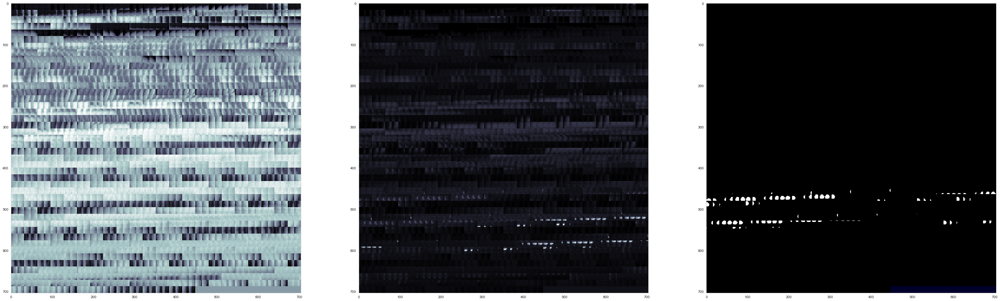

In [5]:
# we want to remove all tiles which do not have the right size (borders are a problem)
n_ct_tiles = [c_tile for c_tile in ct_tiles if c_tile.shape == (tile_size,tile_size)]
n_pet_tiles = [c_tile for c_tile in pet_tiles if c_tile.shape == (tile_size,tile_size)]
n_lab_tiles = [c_tile for c_tile in lab_tiles if c_tile.shape == (tile_size,tile_size)]
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(50,50))
ax1.imshow(montage2d(np.stack(n_ct_tiles,0)), cmap = 'bone')
ax2.imshow(montage2d(np.stack(n_pet_tiles,0)), cmap = 'bone')
ax3.imshow(montage2d(np.stack(n_lab_tiles,0)), cmap = 'gist_earth')

In [6]:
lab_score = [np.mean(c_tile) for c_tile in n_lab_tiles]
ct_tile_flat = [c_tile.flatten() for c_tile in n_ct_tiles]
lab_class = [c_score > 0 for c_score in lab_score]

In [7]:
from sklearn.model_selection import train_test_split
train_tiles, test_tile, train_score, test_score = train_test_split(np.stack(ct_tile_flat), lab_score, 
                                                                   train_size = 0.8, stratify = lab_class, random_state = 1234)
print('Training size', train_tiles.shape, 'Testing size', test_tile.shape)
print('Train tumor tiles', np.where(train_score), 'Test tumor tiles', np.where(test_score))

Training size (1536, 256) Testing size (384, 256)
Train tumor tiles (array([  31,   47,  130,  143,  148,  186,  203,  210,  224,  228,  267,
        296,  327,  336,  362,  375,  397,  399,  405,  409,  420,  429,
        443,  457,  481,  494,  584,  590,  596,  619,  661,  689,  694,
        713,  730,  760,  770,  775,  818,  847,  856,  861,  865,  897,
        915,  961,  974,  987, 1059, 1077, 1096, 1103, 1123, 1147, 1152,
       1226, 1244, 1249, 1294, 1301, 1311, 1370, 1403, 1459, 1468, 1475,
       1490, 1493, 1504, 1533], dtype=int64),) Test tumor tiles (array([ 16,  27,  39,  40,  72,  84, 101, 114, 194, 199, 245, 269, 307,
       329, 347, 368, 372, 374], dtype=int64),)


In [8]:
from sklearn.neighbors import KNeighborsRegressor
knn1_model = KNeighborsRegressor(1, algorithm = 'brute')

In [9]:
knn1_model.fit(train_tiles, train_score)

KNeighborsRegressor(algorithm='brute', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=1, p=2,
          weights='uniform')

In [10]:
test_predictions = knn1_model.predict(test_tile)
print('Predicted Results', test_predictions)

Predicted Results [ 0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.
  0.5078125  0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.5546875  0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.         0.
  0.140625   0.015625   0.         0.         0.         0.         0.         0.
  0.         0.         0.0390625  0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.2734375  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.4296875  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.
  0.     

In [11]:
from sklearn.metrics import confusion_matrix
confusion_matrix(np.array(test_score)>0, np.array(test_predictions)>0)

array([[363,   3],
       [  1,  17]])

(-0.1, 1.1)

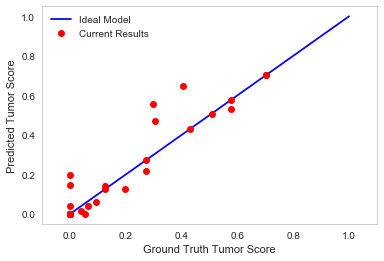

In [12]:
fig, ax1 = plt.subplots(1,1)
ax1.plot([0,1], [0,1], 'b-', label = 'Ideal Model')
ax1.plot(test_score, test_predictions, 'ro', label = 'Current Results')
ax1.set_xlabel('Ground Truth Tumor Score')
ax1.legend()
ax1.set_ylabel('Predicted Tumor Score')
ax1.set_xlim(-0.1,1.1)

In [14]:
# Make a more complicated model with Neighbors = 2

In [15]:
knn2_model = KNeighborsRegressor(4)
knn2_model.fit(train_tiles, train_score)
test2_predictions = knn2_model.predict(test_tile)
print('Predicted Results', test2_predictions)
confusion_matrix(np.array(test_score)>0, np.array(test2_predictions)>0)

Predicted Results [ 0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.5078125   0.          0.          0.          0.
  0.          0.          0.01367188  0.          0.          0.
  0.20703125  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.15234375
  0.01953125  0.          0.          0.          0.16992188  0.          0.
  0.          0.08398438  0.02148438  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.00976562  0.23828125  0.          0.
  0.          0.          0.          0.          0.          0.          0.
  0.          0.          0.21484375  0.          0.          0.          

array([[341,  25],
       [  1,  17]])

(-0.1, 1.1)

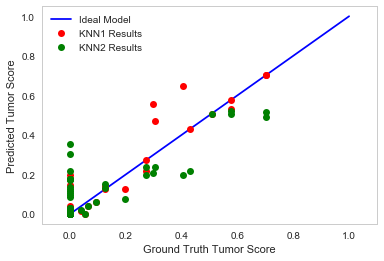

In [16]:
fig, ax1 = plt.subplots(1,1)
ax1.plot([0,1], [0,1], 'b-', label = 'Ideal Model')
ax1.plot(test_score, test_predictions, 'ro', label = 'KNN1 Results')
ax1.plot(test_score, test2_predictions, 'go', label = 'KNN2 Results')
ax1.set_xlabel('Ground Truth Tumor Score')
ax1.legend()
ax1.set_ylabel('Predicted Tumor Score')
ax1.set_xlim(-0.1,1.1)

# Add PET data to tiles
Instead of having just CT tiles, we now make PETCT tiles to train with

In [17]:
petct_tile_flat = np.stack([np.hstack([c_ct_tile.flatten(), c_pet_tile.flatten()])  for c_ct_tile, c_pet_tile in zip(n_ct_tiles, n_pet_tiles)])
print('PETCT Tile Shape',petct_tile_flat.shape)

PETCT Tile Shape (1920, 512)


In [18]:
petct_train_tiles, petct_test_tile, petct_train_score, petct_test_score = train_test_split(petct_tile_flat, lab_score, 
                                                                   train_size = 0.8, stratify = lab_class, random_state = 1234)
print('Training size', petct_train_tiles.shape, 'Testing size', petct_test_tile.shape)
print('Train tumor tiles', len(np.where(petct_train_score)[0]), 
      ', Test tumor tiles', len(np.where(petct_test_score)[0]))

Training size (1536, 512) Testing size (384, 512)
Train tumor tiles 70 , Test tumor tiles 18


In [19]:
from sklearn.neighbors import KNeighborsRegressor 
petct_knn1_model = KNeighborsRegressor(1, algorithm = 'brute')
petct_knn1_model.fit(petct_train_tiles, petct_train_score)

KNeighborsRegressor(algorithm='brute', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=1, p=2,
          weights='uniform')

In [20]:
petct_test_predictions = petct_knn1_model.predict(petct_test_tile)
print('Predicted Results', np.mean(petct_test_predictions))

Predicted Results 0.0169474283854


(-0.1, 1.1)

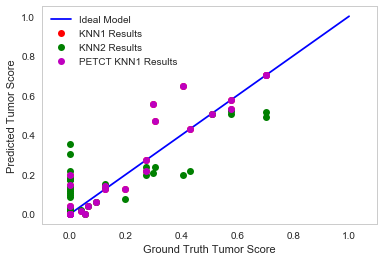

In [21]:
fig, ax1 = plt.subplots(1,1)
ax1.plot([0,1], [0,1], 'b-', label = 'Ideal Model')
ax1.plot(test_score, test_predictions, 'ro', label = 'KNN1 Results')
ax1.plot(test_score, test2_predictions, 'go', label = 'KNN2 Results')
ax1.plot(test_score, petct_test_predictions, 'mo', label = 'PETCT KNN1 Results')
ax1.set_xlabel('Ground Truth Tumor Score')
ax1.legend()
ax1.set_ylabel('Predicted Tumor Score')
ax1.set_xlim(-0.1,1.1)

In [22]:
from sklearn.metrics import confusion_matrix
confusion_matrix(np.array(test_score)>0, np.array(petct_test_predictions)>0)

array([[363,   3],
       [  1,  17]])